In [1]:
import pandas as pd
import numpy as np
import sys
import os
import time
import random
import copy
import math
import scanpy as sc
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl

import seaborn as sns
params = {
    'font.size': 12,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'legend.fontsize': 12,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'font.family': "Helvetica",
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'figure.dpi': 300
   }

mpl.rcParams.update(params)

sns.set_style("ticks")

savefig_args = {"dpi": 300, "bbox_inches": "tight", "pad_inches": 0, "transparent": True}
mpl.rc('savefig', dpi=300)
output_dir = "outs"
output_suffix = ""
output_formats = [".png", ".pdf"]

def save_figure(fig, name, output_dir=output_dir, output_suffix=output_suffix, output_formats=output_formats, savefig_args=savefig_args):
    for output_format in output_formats:
        fig.savefig(output_dir + "/" + name + output_suffix + output_format, **savefig_args)
    return None

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

data_dir = "../data/"

In [2]:
sc.set_figure_params(color_map='viridis')

# Load Data and filter

In [3]:
adata = sc.read_h5ad('by_tissue_qc/bcells.h5ad')

Subsampling for memory reasons

In [4]:
sc.pp.subsample(adata, fraction=0.15)

/home/michaelswift/miniconda3/envs/muon2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


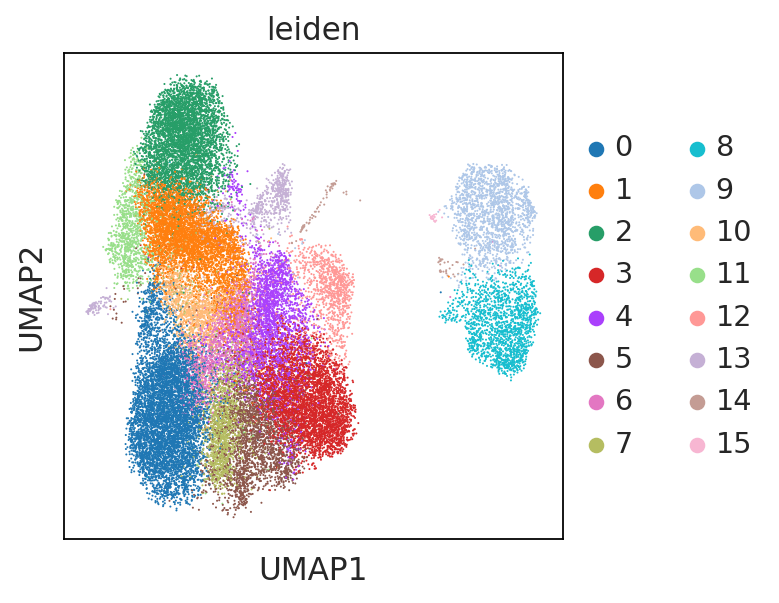

In [5]:
sc.pl.umap(adata, color = 'leiden')

In [6]:
# Correlation Analysis
def convert_sparse_to_dataframe(adata):
    """ Input: anndata object with sparse matrix as .X attribute
        Returns: Pandas dataframe with rows as cells and columns as genes
        My take: Converting the data to a df inefficient but convenient and possibly more readable"""
    # Get the gene expression values for each cell x gene
    columns = adata.var.index.to_list()
    index = adata.obs.index.to_list()
    try:
        dense_array = adata.raw.X.toarray()
    except:
        dense_array = adata.raw.X
    df = pd.DataFrame(data=dense_array, index=index, columns=columns)
    return df

# convert cell x gene matrix to df
df = convert_sparse_to_dataframe(adata)
# Use Numpy to do the Pearson Correllation of all values
# Did this because pandas corr is very slow, must be a bug.. 
df_corr = np.corrcoef(df.values, rowvar=False) 

# Put the labels back on and make it a df
df_corr = pd.DataFrame(df_corr, index = df.columns, columns=df.columns)

# Check that the matrix looks correct
df_corr.head()

/home/michaelswift/miniconda3/envs/muon2/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/michaelswift/miniconda3/envs/muon2/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,OR4F29,AC114498.1,OR4F16,AL669831.2,LINC01409,FAM87B,LINC01128,LINC00115,FAM41C,AL645608.6,AL645608.2,AL645608.4,LINC02593,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,AL645608.7,HES4,ISG15,AL645608.1,AGRN,AL645608.5,AL645608.8,RNF223,C1orf159,AL390719.3,LINC01342,AL390719.2,TTLL10-AS1,TTLL10,TNFRSF18,TNFRSF4,SDF4,B3GALT6,C1QTNF12,AL162741.1,UBE2J2,LINC01786,SCNN1D,ACAP3,PUSL1,INTS11,AL139287.1,CPTP,TAS1R3,DVL1,MXRA8,AURKAIP1,CCNL2,MRPL20-AS1,MRPL20,AL391244.2,ANKRD65,AL391244.1,TMEM88B,LINC01770,VWA1,ATAD3C,ATAD3B,ATAD3A,TMEM240,SSU72,AL645728.1,FNDC10,AL691432.4,AL691432.2,MIB2,MMP23B,CDK11B,FO704657.1,SLC35E2B,CDK11A,SLC35E2A,NADK,GNB1,AL109917.1,CALML6,TMEM52,CFAP74,AL391845.2,GABRD,AL391845.1,PRKCZ,AL590822.2,PRKCZ-AS1,FAAP20,AL590822.1,SKI,AL590822.3,MORN1,AL589739.1,AL513477.2,RER1,PEX10,PLCH2,AL139246.1,AL139246.4,PANK4,HES5,AL139246.5,TNFRSF14-AS1,TNFRSF14,AL139246.3,PRXL2B,MMEL1,AL831784.1,TTC34,AC242022.2,AC242022.1,AL592464.2,AL592464.3,AL592464.1,AL589702.1,ACTRT2,PRDM16-DT,PRDM16,AL008733.1,AL590438.1,AL354743.2,AL354743.1,ARHGEF16,AL512413.1,MEGF6,AL513320.1,TPRG1L,WRAP73,TP73,AL136528.1,AL136528.2,CCDC27,SMIM1,LRRC47,AL365330.1,CEP104,DFFB,C1orf174,LINC01134,LINC01346,LINC01345,LINC02780,AL805961.1,LINC01777,AL355602.1,Z98747.1,LINC01646,AJAP1,Z98886.1,BX005132.1,LINC02781,LINC02782,AL139823.1,Z98259.3,Z98259.2,Z98259.1,AL365255.1,NPHP4,KCNAB2,CHD5,RPL22,AL031847.1,RNF207,ICMT,LINC00337,HES3,GPR153,ACOT7,AL031848.2,HES2,ESPN,AL031848.1,TNFRSF25,PLEKHG5,NOL9,TAS1R1,ZBTB48,KLHL21,PHF13,THAP3,DNAJC11,LINC01672,AL591163.1,CAMTA1-DT,CAMTA1,AL512330.1,CAMTA1-IT1,Z97987.1,AL365194.1,AL359881.3,AL359881.2,AL359881.1,VAMP3,Z98884.2,PER3,Z98884.1,UTS2,TNFRSF9,PARK7,AL034417.4,AL034417.3,ERRFI1,AL034417.2,LINC01714,AL358876.2,SLC45A1,RERE,RERE-AS1,AL357552.2,ENO1,ENO1-AS1,CA6,SLC2A7,SLC2A5,GPR157,MIR34AHG,LNCTAM34A,H6PD,SPSB1,BX323043.1,LINC02606,AL928921.1,SLC25A33,TMEM201,PIK3CD,PIK3CD-AS1,PIK3CD-AS2,CLSTN1,CTNNBIP1,AL357140.1,AL357140.4,LZIC,AL357140.2,NMNAT1,AL603962.1,RBP7,UBE4B,KIF1B,AL139424.3,AL139424.2,...,NSDHL,ZNF185,U82671.1,PNMA5,PNMA3,PNMA6A,MAGEA1,AC236972.3,AC236972.4,PNMA6F,ZNF275,PNMA6E,ZFP92,TREX2,HAUS7,BGN,ATP2B3,CCNQ,DUSP9,PNCK,SLC6A8,BCAP31,ABCD1,U52111.1,PLXNB3,SRPK3,IDH3G,SSR4,PDZD4,L1CAM,U52112.1,AVPR2,ARHGAP4,NAA10,RENBP,HCFC1,HCFC1-AS1,TMEM187,IRAK1,MECP2,OPN1LW,OPN1MW,OPN1MW2,OPN1MW3,TEX28,TKTL1,AC245140.1,FLNA,AC245140.3,EMD,RPL10,AC245140.2,DNASE1L1,TAZ,AC244090.1,ATP6AP1,GDI1,FAM50A,PLXNA3,LAGE3,UBL4A,SLC10A3,FAM3A,AC244090.3,G6PD,IKBKG,FAM223A,CTAG1A,CTAG1B,FAM223B,CTAG2,GAB3,DKC1,MPP1,SMIM9,F8,H2AFB1,F8A1,FUNDC2,CMC4,MTCP1,BRCC3,VBP1,RAB39B,CLIC2,AC234781.1,H2AFB2,F8A2,F8A3,H2AFB3,TMLHE-AS1,BX571846.1,TMLHE,SPRY3,VAMP7,IL9R,WASIR1,SRY,AC006040.1,RPS4Y1,AC006157.1,ZFY,ZFY-AS1,LINC00278,TGIF2LY,AC012078.2,AC010737.1,AC010722.1,PCDH11Y,TSPY2,LINC00280,TTTY1B,TTTY2B,TTTY21B,TTTY7,TTTY8B,AMELY,TBL1Y,AC011297.1,PRKY,TTTY12,AC064829.1,TTTY18,TTTY19,TTTY20,TSPY4,TSPY8,FAM197Y7,FAM197Y6,TSPY3,TSPY1,TSPY9P,TSPY10,TTTY8,TTTY7B,TTTY21,TTTY2,TTTY1,TTTY22,AC010891.1,TTTY23,USP9Y,AC244213.1,DDX3Y,UTY,TMSB4Y,VCY,VCY1B,AC010723.1,NLGN4Y,NLGN4Y-AS1,AC011751.1,FAM41AY1,FAM224B,CDY2B,CDY2A,FAM224A,FAM41AY2,AC022486.1,HSFY1,TTTY9B,HSFY2,TTTY14,AC007244.1,AC010889.1,KDM5D,AC010889.2,TTTY10,EIF1AY,AC009494.2,RPS4Y2,AC007876.1,PRORY,AC010086.3,RBMY1B,RBMY1A1,TTTY13,AC024236.1,RBMY1D,RBMY1E,PRY2,AC007359.1,TTTY6B,RBMY1F,TTTY5,RBMY1J,AC008175.1,TTTY6,PRY,TTTY17A,TTTY4,BPY2,DAZ1,DAZ2,PRYP3,TTTY3B,CDY1B,TTTY17B,TTTY4B,BPY2B,DAZ3,DAZ4,BPY2C,TTTY4C,TTTY17C,LINC00266-4P,CDY1,TTTY3,MT-ND1,MT-ND2,MT-CO1,MT-CO2,MT-ATP8,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB,BX004987.1,AC145212.1,MAFIP,AC011043.1,AC011043.2,AC011841.1,BX072566.1,AL354822.1,AL592183.1,AC240274.1,AC213203.2,AC213203.1,AC004556.3,AC233755.2,AC233755.1,AC136352.3,AC136352.2,AC171558.3,AC171558.1,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,A

## Correlation of MKI67 with other genes

In [9]:
GOI = 'MKI67'

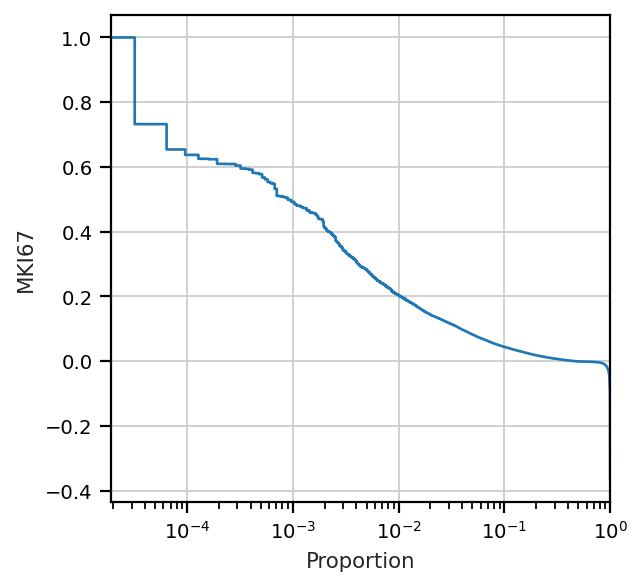

In [10]:
sns.set_context('paper')
g = sns.ecdfplot(y = df_corr[GOI], complementary=True, stat='proportion')
g.set_xscale('log')

In [11]:
cutoff = 0.3
df_corr[df_corr[GOI] > cutoff][GOI].sort_values(ascending = False)

MKI67        1.000000
RRM2         0.732327
TYMS         0.654049
BIRC5        0.637338
ASPM         0.625293
DIAPH3       0.623941
ZWINT        0.609798
TPX2         0.609367
PCLAF        0.609160
UBE2C        0.604326
TOP2A        0.595291
GTSE1        0.594050
CCNA2        0.591819
AURKB        0.581833
CDC20        0.580661
SHCBP1       0.577795
HJURP        0.567603
DLGAP5       0.561894
HIST1H3B     0.553747
PKMYT1       0.550452
CDK1         0.548222
POLQ         0.532755
HIST1H3C     0.510680
NUSAP1       0.509976
NCAPG        0.509089
ANLN         0.507605
SPC25        0.506566
KIF23        0.504869
HIST1H3G     0.498814
TK1          0.498476
KIFC1        0.492624
PLK1         0.492452
NCAPH        0.487150
CENPF        0.483886
BUB1         0.480287
CLSPN        0.480225
CCNB2        0.479770
CKAP2L       0.477005
CDCA3        0.475727
CDCA5        0.473198
CDC45        0.473173
CDCA2        0.472923
HIST1H1B     0.466665
KIF18B       0.466297
CDC6         0.464467
BUB1B     

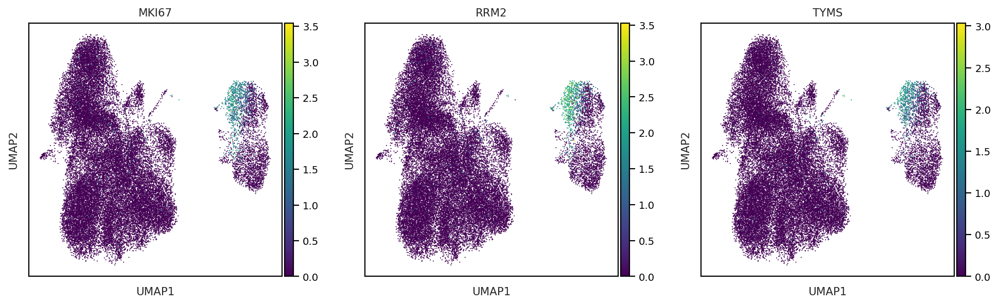

In [13]:
sc.pl.umap(adata, color = ["MKI67", "RRM2", 'TYMS'])

# Define Gene Signature of the top 20 MKI67 correlated genes

In [23]:
cell_cycle_genes = list(df_corr[df_corr[GOI] > cutoff][GOI].sort_values(ascending = False).index[:25])

In [24]:
cell_cycle_genes

['MKI67',
 'RRM2',
 'TYMS',
 'BIRC5',
 'ASPM',
 'DIAPH3',
 'ZWINT',
 'TPX2',
 'PCLAF',
 'UBE2C',
 'TOP2A',
 'GTSE1',
 'CCNA2',
 'AURKB',
 'CDC20',
 'SHCBP1',
 'HJURP',
 'DLGAP5',
 'HIST1H3B',
 'PKMYT1',
 'CDK1',
 'POLQ',
 'HIST1H3C',
 'NUSAP1',
 'NCAPG']

## Now Load full object

In [124]:
adata = sc.read_h5ad('by_tissue_qc/bcells.h5ad')

In [125]:
sc.tl.score_genes(adata, gene_list=cell_cycle_genes, score_name = "cycling_score")

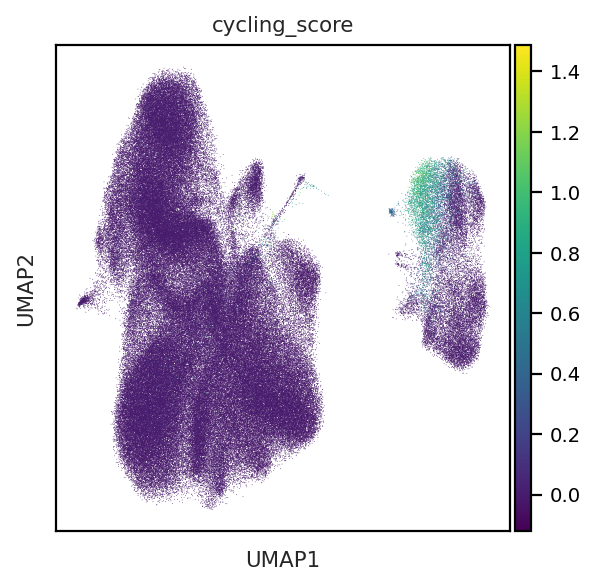

In [126]:
sc.pl.umap(adata, color = 'cycling_score')

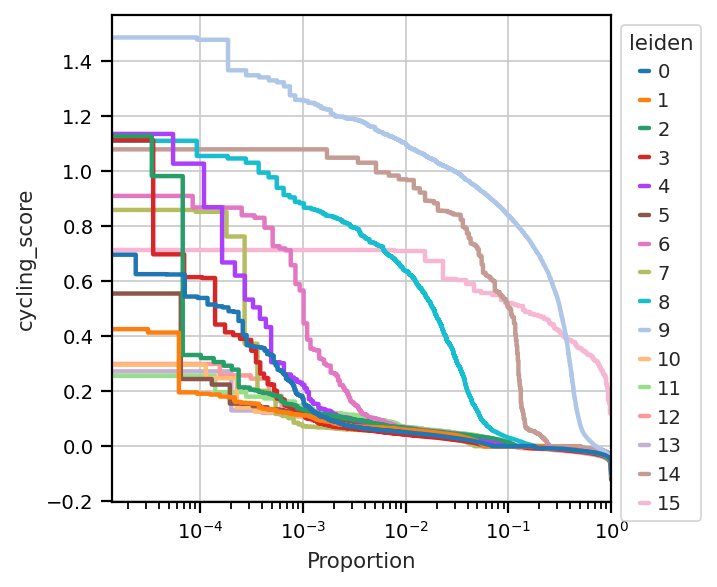

In [127]:
sns.set_context('paper')
g = sns.ecdfplot(data = adata.obs, y = "cycling_score", hue = 'leiden', complementary=True, stat='proportion', lw=2)
g.set_xscale('log')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

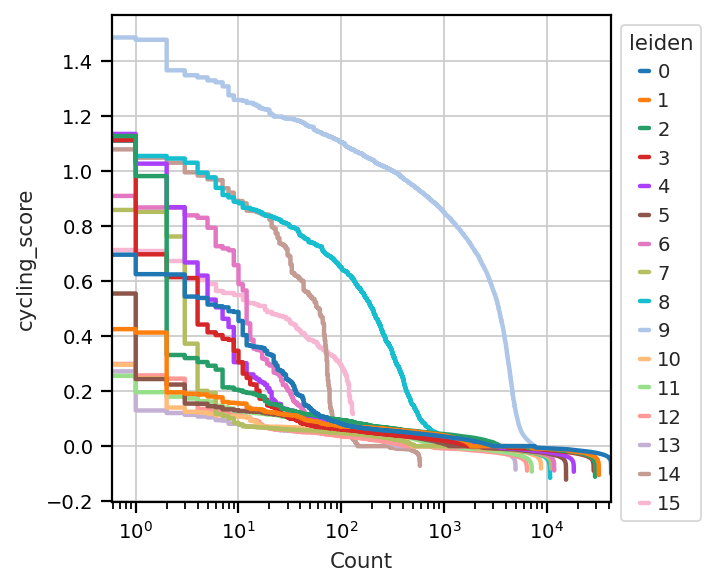

In [128]:
sns.set_context('paper')
g = sns.ecdfplot(data = adata.obs, y = "cycling_score", hue = 'leiden', complementary=True, stat='count', lw=2)
g.set_xscale('log')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

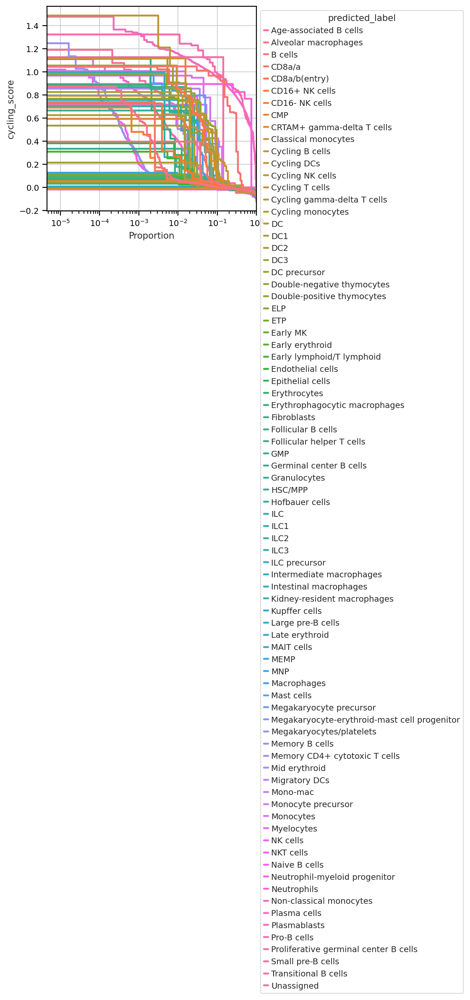

In [129]:
sns.set_context('paper')
g = sns.ecdfplot(data = adata.obs, y = "cycling_score", hue = 'predicted_label', complementary=True, stat='proportion', lw = 2)
g.set_xscale('log')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

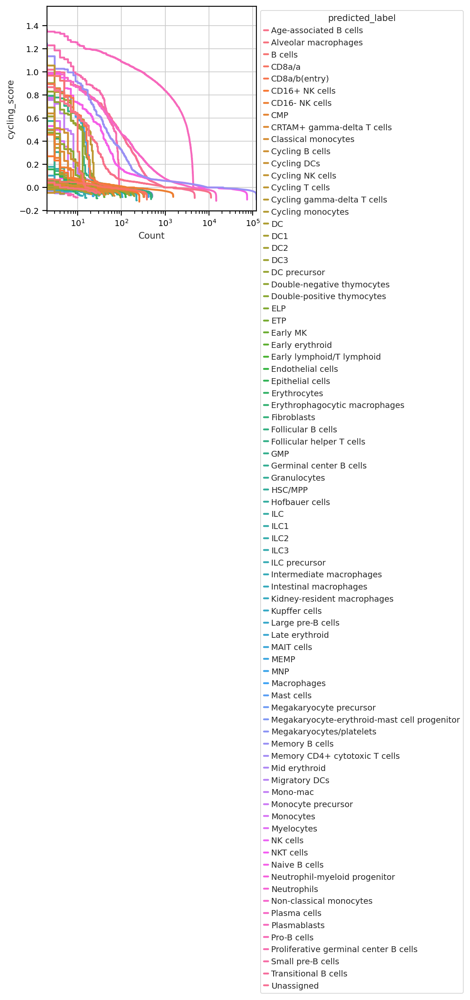

In [130]:
sns.set_context('paper')
g = sns.ecdfplot(data = adata.obs, y = "cycling_score", hue = 'predicted_label', complementary=True, stat='count', lw = 2)
g.set_xscale('log')
sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

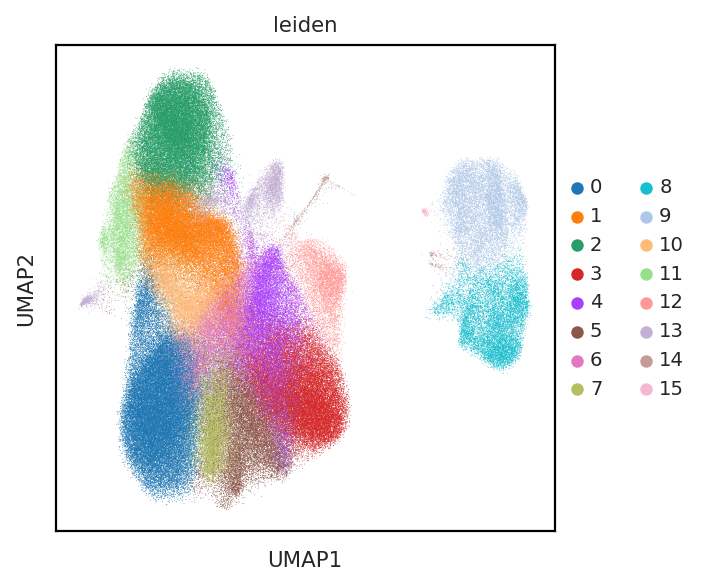

In [132]:
sc.pl.umap(adata, color = 'leiden')

In [133]:
adata.obs.loc[:, 'cycling'] = adata.obs.cycling_score > 0.2

In [134]:
adata = adata[adata.obs.predicted_label.str.contains('Plasma|B cells')]

In [136]:
import celltypist
from celltypist import models

👉 Detailed model information can be found at `https://www.celltypist.org/models`


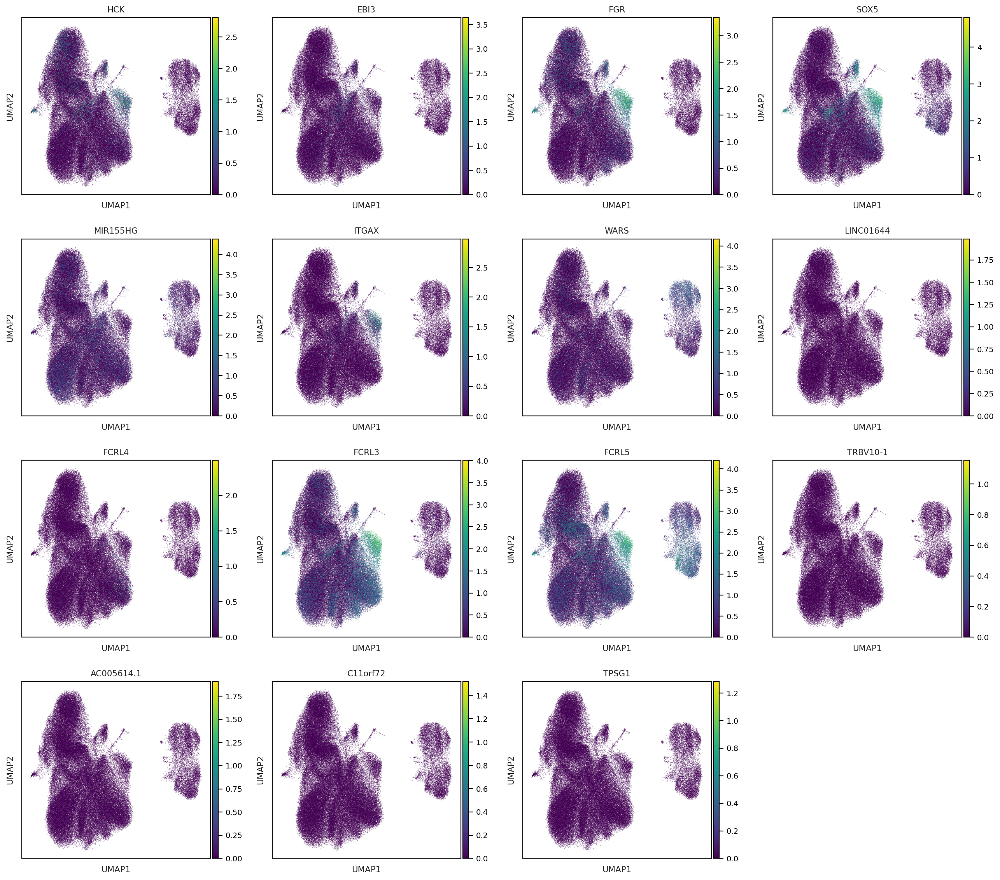

In [137]:
models.models_description()

model = models.Model.load(model = '/home/michaelswift/.celltypist/data/models/Immune_All_Low.pkl')
top_genes = model.extract_top_markers("Age-associated B cells", 15)
sc.pl.umap(adata, color = list(top_genes))
# these genes doen't appear specific, a B cell

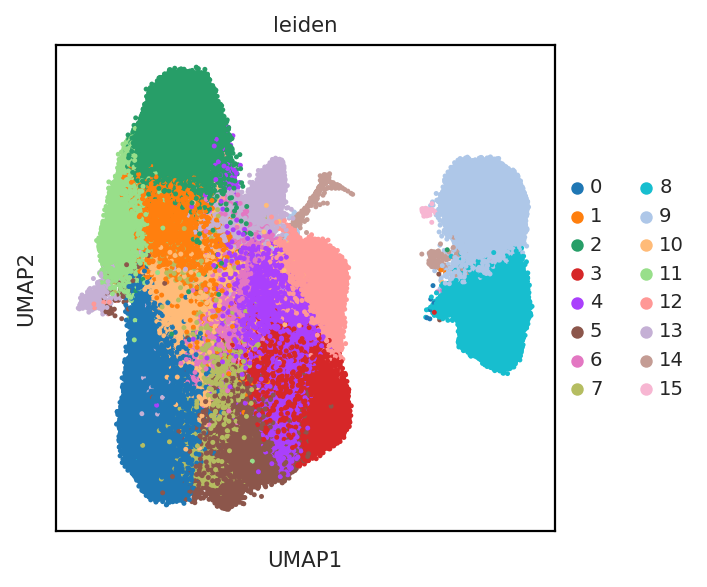

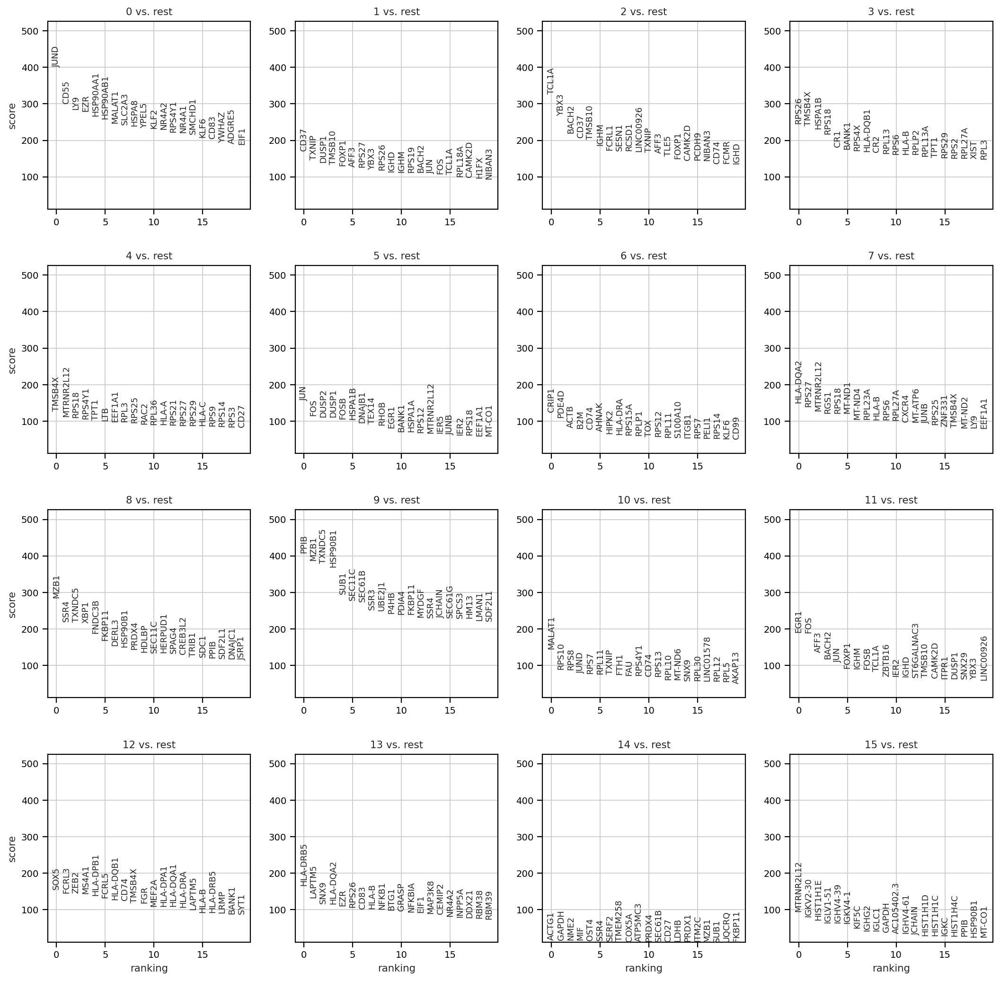

In [138]:
GROUP = 'leiden'

sc.tl.rank_genes_groups(adata, groupby=GROUP)

sc.pl.umap(adata, color = GROUP, size = 20)

sc.pl.rank_genes_groups(adata)

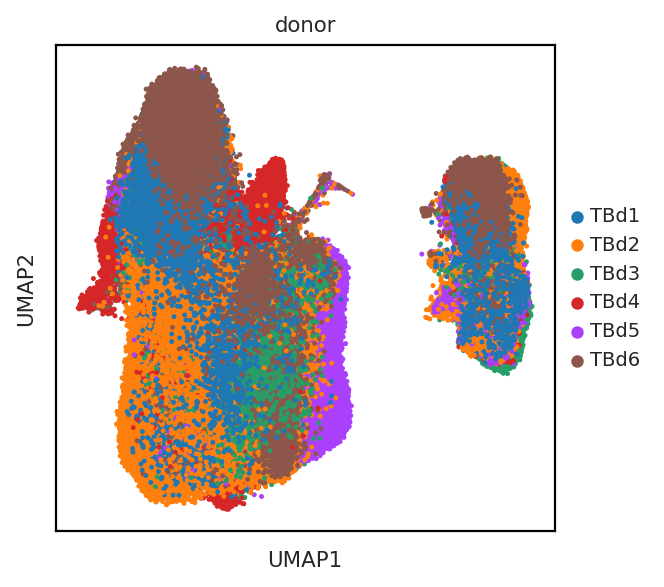

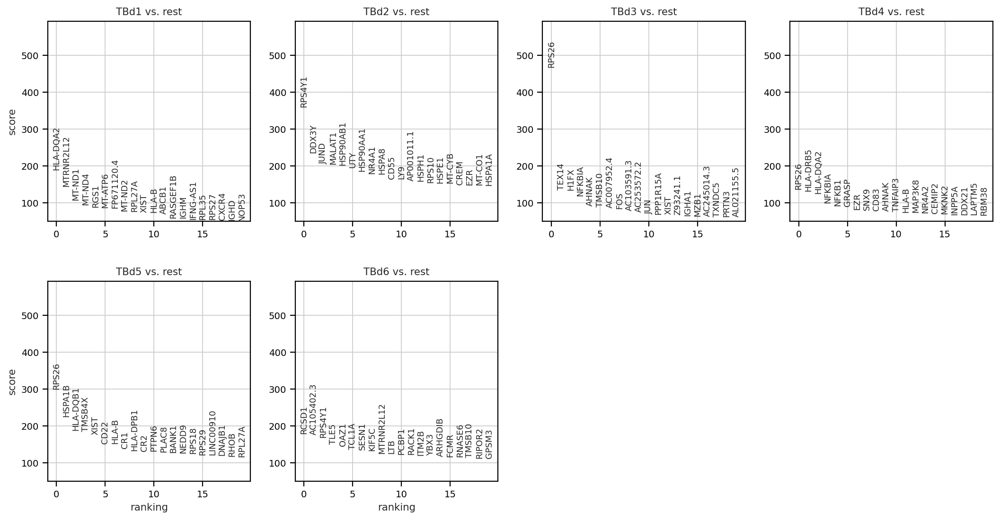

In [139]:
GROUP = 'donor'

sc.tl.rank_genes_groups(adata, groupby=GROUP)

sc.pl.umap(adata, color = GROUP, size = 20)

sc.pl.rank_genes_groups(adata)

In [140]:
adata.obs.cycling = adata.obs.cycling.astype(str)

... storing 'cycling' as categorical


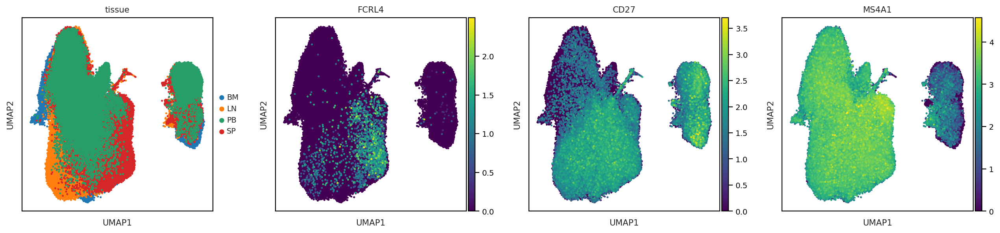

In [141]:
sc.pl.umap(adata, color = ['tissue', 'FCRL4', 'CD27', "MS4A1"], size = 20)


# Investigate the Plasma Cell Cycling

In [142]:
plasma = adata[adata.obs.predicted_label.str.contains("Plasma")]

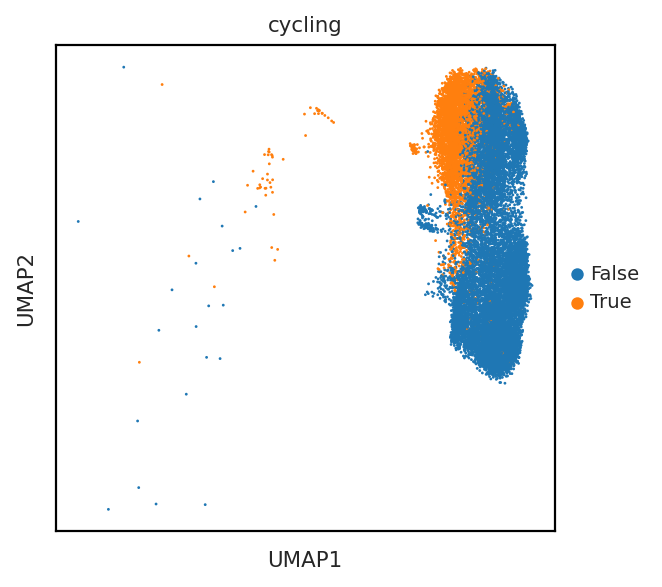

In [143]:
sc.pl.umap(plasma, color = 'cycling')

In [153]:
def highly_variable_noIR(adata, n_top_genes):
    sc.pp.highly_variable_genes(adata, n_top_genes=n_top_genes)
    adata.var.loc[adata.var.index.str.contains("IGHV|IGLV|IGKV"), 'highly_variable'] = False
    return adata

In [154]:
plasma = highly_variable_noIR(plasma, n_top_genes=1500)

In [155]:
sc.pp.pca(plasma)
sc.pp.neighbors(plasma)
sc.tl.umap(plasma)
sc.tl.leiden(plasma, resolution=0.7)

In [156]:
plasma.uns['leiden_colors'] = []

In [160]:
sc.tl.rank_genes_groups(plasma, groupby='leiden', reference='8')

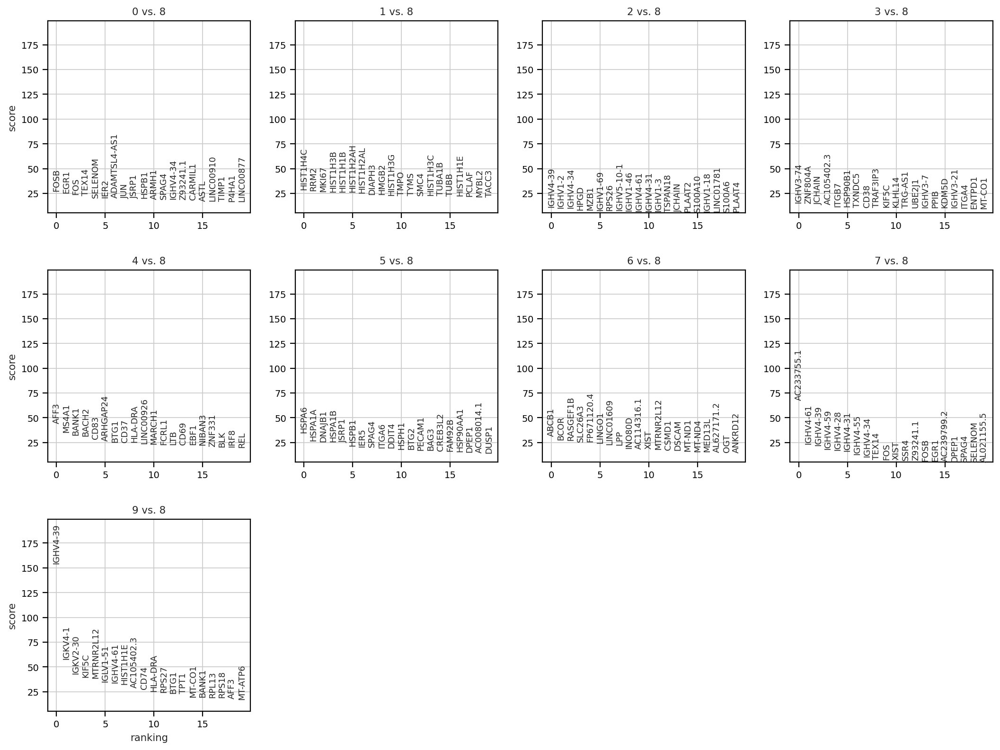

In [161]:
sc.pl.rank_genes_groups(plasma)

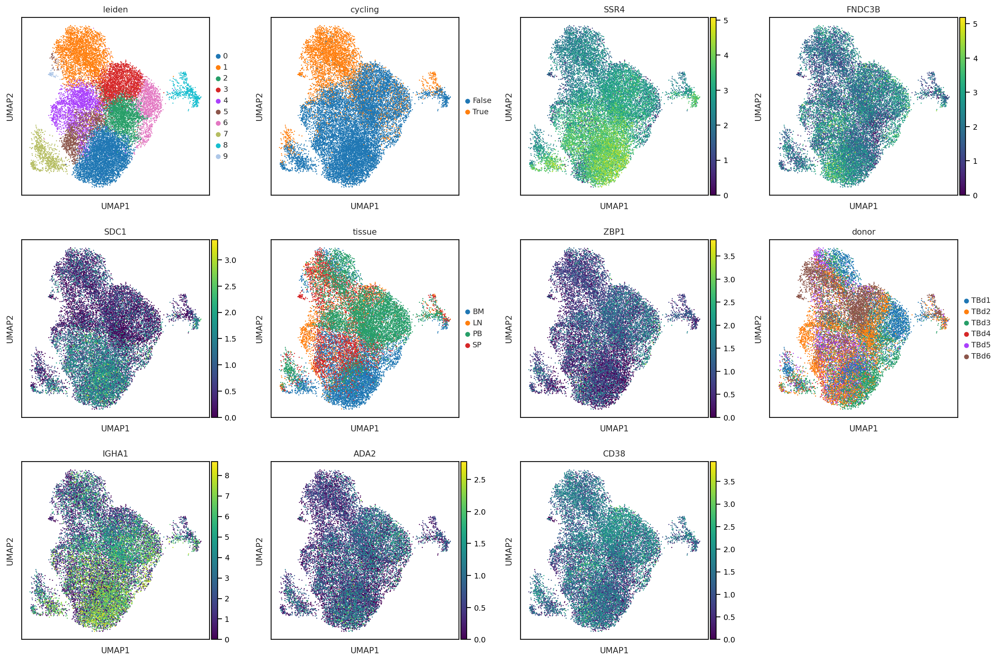

In [162]:
sc.pl.umap(plasma, color = ['leiden', 'cycling', 'SSR4', 'FNDC3B', 'SDC1', 'tissue', 'ZBP1', 'donor', "IGHA1", "ADA2", "CD38"])

In [163]:
data = adata.obs

In [164]:
## Make plot of cycling vs non-cycling cells in ASC compartment

In [165]:
data = data[data.predicted_label.str.contains("Plasma")]

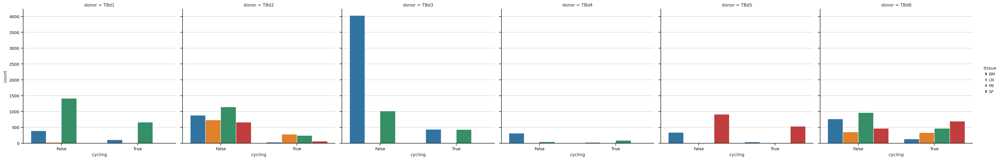

In [168]:
sns.catplot(data = data, kind = 'count', x = "cycling", hue = 'tissue', col='donor')